# **📝Presentación**

### El objetivo general de este trabajo es realizar un ejercicio de Procesamiento de Lenguaje Natural aplicando los conceptos vistos en las unidades 1 y 2:

* Web Scrapping
* Preprocesamiento de texto
* Tokenización
* Eliminación de stop words
* Vectorización de texto
* Análisis de frecuencias
* Visualización de datos textuales



# **🔎Tema**
### Se recopilarán artículos periodísticos de la sección de **Economía** del diario [Página12](https://www.pagina12.com.ar/) y [Clarín](https://https://www.clarin.com/) para analizar los acontecimientos publicados en materia económica en un período de 20 días, iniciando el 01 de Abril.

In [1]:
import requests
from bs4 import BeautifulSoup
from time import sleep

In [2]:
# Utilizo User-Agent para evitar que los sitios bloqueen mi solicitud al scrapear la web
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'
}


# 1. 🔗Obtención de los textos
Scrapeo los artículos de Página 12 y Clarín utilizando la librería `BeautifulSoup`

## **1.1 Scrapping de Página12📰**

In [ ]:
url_p12_uno="https://www.pagina12.com.ar/secciones/economia?page=1"

In [ ]:
contenido_p12_uno = requests.get(url_p12_uno).text
soup_p12_uno = BeautifulSoup(contenido_p12_uno, "html.parser")

In [ ]:
soup_p12_uno.find_all("a")

[<a href="https://www.pagina12.com.ar"><?xml version="1.0" encoding="UTF-8"?><svg height="58x" version="1.1" viewbox="0 0 630 135" width="270px" xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink"><!-- Generator: Sketch 44.1 (41455) - http://www.bohemiancoding.com/sketch --><title>logo_pagina_12_n</title><desc>Created with Sketch.</desc><defs></defs><g fill="none" fill-rule="evenodd" id="Page-1" stroke="none" stroke-width="1"><g id="logo_pagina_12_n"><g><path d="M45.9541,45.3559 C45.9541,50.8949 45.9541,51.6429 52.2411,51.6429 C68.2581,51.6429 71.5511,45.0569 71.5511,37.1239 C71.5511,26.6449 63.9171,24.2509 52.6901,24.2509 C46.4031,24.2509 45.9541,26.7939 45.9541,31.2859 L45.9541,45.3559 Z M52.5411,71.4019 C46.4031,71.1029 45.8051,71.2519 45.8051,73.7969 C45.8051,82.9279 46.5531,85.9219 50.1451,85.9219 C52.9901,85.9219 55.5341,84.8749 58.2291,84.8749 C64.2161,84.8749 67.3601,90.4129 67.3601,94.9029 C67.3601,101.3399 62.8691,106.2799 55.0851,106.2799 C47.4511,1

In [ ]:
for a in soup_p12_uno('a', href=True):
  print("'https://www.pagina12.com.ar/" + a['href'] + "',")


'https://www.pagina12.com.ar/https://www.pagina12.com.ar',
'https://www.pagina12.com.ar//edicion-impresa',
'https://www.pagina12.com.ar/https://socios.pagina12.com.ar/pdf-edicion-impresa',
'https://www.pagina12.com.ar/https://newsletters.pagina12.com.ar/',
'https://www.pagina12.com.ar/https://socios.pagina12.com.ar/asociate?item=planes',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar/am750/radio-en-vivo',
'https://www.pagina12.com.ar/https://socios.pagina12.com.ar/asociate',
'https://www.pagina12.com.ar//edicion-impresa',
'https://www.pagina12.com.ar/https://socios.pagina12.com.ar/pdf-edicion-impresa',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar/buenos-aires12',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar/suplementos/soy',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar/am750/radio-en-vivo',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar//buenos-aires12',
'https://www.pagina12.com.ar/https://www.pagina12.com.ar//suplementos/soy',
'

In [ ]:
lista_p12_uno = ['https://www.pagina12.com.ar//819251-provincias-con-superavit-fiscal',
'https://www.pagina12.com.ar/819241-prepagas-otro-problema',
'https://www.pagina12.com.ar/819240-milei-lanzo-una-campana-para-exigir-que-no-se-validen-los-au',
'https://www.pagina12.com.ar//819239-los-dolares-siguen-de-viaje',
'https://www.pagina12.com.ar//819061-el-mercado-sigue-de-festejo',
'https://www.pagina12.com.ar/819022-fabrica-ceramista-en-crisis',
'https://www.pagina12.com.ar/818949-elogios-del-fmi-a-su-mejor-discipulo-y-principal-deudor',
'https://www.pagina12.com.ar/818909-el-gobierno-elimino-el-recargo-del-30-para-compras-en-dolare']

In [ ]:
# Defino una función para obtener el texto de la URL
def obtener_texto_de_url(url):

    print('URL', url)
    text = ""
    try:
        page = requests.get(url, headers=headers).text
        soup = BeautifulSoup(page, "lxml") # "lxml" parser
        text = [p.text for p in soup.find(class_="article-main-content article-text").find_all('p')]
    except Exception:
        print('ERROR, puede que un firewall esté bloqueando la extracción del texto.')
        return ''
    sleep(390)  # Pausa para evitar ser bloqueado por un firewall
    return text


In [ ]:
# Obtener los textos por separado
textos_separados_p12_uno= [obtener_texto_de_url(url) for url in lista_p12_uno]

In [ ]:
# Guardar los textos en un archivo 'textos_p12_uno.txt'
with open('textos_p12_uno.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_uno:
      archivo.write(str(texto) + '\n')

In [ ]:
url_p12_dos= "https://www.pagina12.com.ar/secciones/economia?page=2"

In [ ]:
contenido_p12_dos = requests.get(url_p12_dos, headers= headers).text
soup_p12_dos = BeautifulSoup(contenido_p12_dos, "html.parser")

In [ ]:
soup_p12_dos.find_all("a")

In [ ]:
for a in soup_p12_dos.find_all('a', href=True):
  print("'https://www.pagina12.com.ar/" + a['href'] + "',")


In [ ]:
lista_p12_dos = ['https://www.pagina12.com.ar//818856-inusual-baja-del-dolar-minorista',
'https://www.pagina12.com.ar//818862-avalancha-de-bienes-de-consumo',
'https://www.pagina12.com.ar//818864-vista-compra-petronas',
'https://www.pagina12.com.ar//818866-superavit-con-ganadores-y-perdedores',
'https://www.pagina12.com.ar//818741-el-biodiesel-pide-aumentar-los-precios',
'https://www.pagina12.com.ar//818627-dolar-blue-dolar-hoy-a-cuanto-cotizan-el-miercoles-16-de-abr',
'https://www.pagina12.com.ar//818501-se-duplico-la-demanda-de-dolares',
'https://www.pagina12.com.ar//818521-jornada-estable-para-el-dolar']

In [ ]:
# Obtener los textos por separado
textos_separados_p12_dos = [obtener_texto_de_url(url) for url in lista_p12_dos]

In [ ]:
url_p12_dos = "https://www.pagina12.com.ar//818862-avalancha-de-bienes-de-consumo" # Verifico origen del ERROR

In [ ]:
contenido_url_p12 = requests.get(url_p12_dos).text
soup_url_p12_dos = BeautifulSoup(contenido_url_p12, "html.parser")

In [ ]:
articulo = soup_url_p12_dos.find_all("div", class_="article-main-content article-text")
print(articulo)

El objeto `articulo` se encuentra vacío porque es un contenido exlusivo para soci@s del diario Página12.

In [ ]:
textos_separados_p12_dos[1]

Comprobamos que, tal como se definió en la función, si se detecta un error devuelve una cadena vacía `''`.

In [ ]:
del textos_separados_p12_dos[1] # Elimino la lista vacía
len(textos_separados_p12_dos) # Compruebo que ahora quedaron 7 elementos

In [ ]:
# Guardo los textos de la parte 2 en el archivo 'textos_p12_dos.txt'
with open('textos_p12_dos.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_dos:
      archivo.write(str(texto) + '\n')

In [ ]:
url_p12_tres= "https://www.pagina12.com.ar/secciones/economia?page=3"

In [ ]:
contenido_p12_tres = requests.get(url_p12_tres, headers= headers).text
soup_p12_tres = BeautifulSoup(contenido_p12_tres, "html.parser")

In [ ]:
soup_p12_tres.find_all("a")

In [ ]:
for a in soup_p12_tres.find_all("a", href=True):
  print("'https://www.pagina12.com.ar" + a["href"]+ "' ,")

In [ ]:
lista_p12_tres = ['https://www.pagina12.com.ar/818530-paritarias-con-techo-precios-no',
'https://www.pagina12.com.ar/818567-parche-del-fmi-a-las-reservas',
'https://www.pagina12.com.ar/818587-canasta-45-por-ciento-mas-cara',
'https://www.pagina12.com.ar/818588-menos-rentabilidad-y-salario',
'https://www.pagina12.com.ar/818590-los-metalurgicos-siguen-pinchados',
'https://www.pagina12.com.ar/818405-the-economist-advirtio-que-javier-milei-podria-perder-popula',]

In [ ]:
# Obtener los textos por separado
textos_separados_p12_tres = [obtener_texto_de_url(url) for url in lista_p12_tres]

In [ ]:
# Guardo los textos de la parte 3 en el archivo 'textos_p12_tres.txt'
with open('textos_p12_tres.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_tres:
      archivo.write(str(texto) + '\n')

In [ ]:
# Scrapear y obtener urls en simultáneo
def scrape_url(urls):
    for u in urls:
      contenido = requests.get(u).text
      soup = BeautifulSoup(contenido, "lxml")
      print('URL',urls)
      enlaces = []
      for a in soup.find_all('a', href=True):
            print("'https://www.pagina12.com.ar" + a['href']+ "',")
            enlaces.append(a['href'])
    sleep(240)
    return enlaces

In [ ]:
urls = ["https://www.pagina12.com.ar/secciones/economia?page=4",
        "https://www.pagina12.com.ar/secciones/economia?page=5",
        "https://www.pagina12.com.ar/secciones/economia?page=6"]
links = scrape_url(urls)
print(links)

In [ ]:
lista_p12_cuatro = ['https://www.pagina12.com.ar/818208-un-manual-de-lobby-y-palabras-prohibidas',
'https://www.pagina12.com.ar/818236-el-mapa-de-la-informalidad',
'https://www.pagina12.com.ar/818257-la-vuelta-del-dolar-pure',
'https://www.pagina12.com.ar/818260-devaluacion-del-13-al-15-por-ciento-sobre-el-dolar-oficial-a',
'https://www.pagina12.com.ar/818262-dificultades-en-los-bancos-para-arrancar',
'https://www.pagina12.com.ar/818089-abre-el-cepo-que-pasara-con-los-precios-de-netflix-spotify-d',
'https://www.pagina12.com.ar/817774-como-el-fmi-obligo-a-milei-y-caputo-a-devaluar',
'https://www.pagina12.com.ar/817619-tiro-la-toalla-devaluo-y-abrio',
'https://www.pagina12.com.ar/817515-150-despidos-65-anos-perdidos',
'https://www.pagina12.com.ar/817560-saluden-a-las-canastas-que-vuelan',
'https://www.pagina12.com.ar/817608-dolares-frescos-para-aceitar-la-bicicleta',
'https://www.pagina12.com.ar/817609-inversiones-de-ypf',
'https://www.pagina12.com.ar/817552-el-comunicado-del-banco-central-con-los-principales-puntos-d',
'https://www.pagina12.com.ar/817514-por-que-la-inflacion-de-marzo-se-disparo-hasta-el-3-7',
'https://www.pagina12.com.ar/817321-llach-versus-sturzenegger',
'https://www.pagina12.com.ar/817344-dolares-para-arriba-reservas-para-abajo',
'https://www.pagina12.com.ar/817304-el-mapa-del-superavit-fiscal-en-el-primer-trimestre']

In [ ]:
# Obtener los textos por separado
textos_separados_p12_cuatro = [obtener_texto_de_url(url) for url in lista_p12_cuatro]

In [ ]:
# Guardo los textos de la parte 4 en el archivo 'textos_p12_cuatro.txt'
with open('textos_p12_cuatro.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_cuatro:
      archivo.write(str(texto) + '\n')

In [ ]:
urls = ["https://www.pagina12.com.ar/secciones/economia?page=7",
        "https://www.pagina12.com.ar/secciones/economia?page=8",
        "https://www.pagina12.com.ar/secciones/economia?page=9",
        "https://www.pagina12.com.ar/secciones/economia?page=10",
        "https://www.pagina12.com.ar/secciones/economia?page=11",
        ]
links = scrape_url(urls)
print(links)

In [ ]:
lista_p12_cinco = ['https://www.pagina12.com.ar/817211-el-banco-central-renovo-el-swap-con-china',
'https://www.pagina12.com.ar/817187-aceiteros-firmo-un-nuevo-aumento-paritario-con-un-salario-ba',
'https://www.pagina12.com.ar/817048-apenas-unas-horas-de-euforia',
'https://www.pagina12.com.ar/817017-la-industria-crecio-5-6-interanual',
'https://www.pagina12.com.ar/816850-la-guerra-comercial-no-para-china-anuncio-aranceles-del-84-a',
'https://www.pagina12.com.ar/816900-se-disparo-la-inflacion-en-caba-en-marzo-fue-del-3-2',
'https://www.pagina12.com.ar/816733-el-colchon-que-tiene-brasil',
'https://www.pagina12.com.ar/816736-caos-y-confusion-en-el-palacio-de-hacienda',
'https://www.pagina12.com.ar/816746-otra-jornada-de-malos-resultados',
'https://www.pagina12.com.ar/816747-nuevo-record-para-la-mineria',
'https://www.pagina12.com.ar/816776-la-manguera-en-manos-del-usuario',
'https://www.pagina12.com.ar/816656-la-inflacion-de-marzo-2025-pronosticos-y-expectativas-a-dias',
'https://www.pagina12.com.ar/816226-vuelven-a-derrumbarse-las-bolsas-de-todo-el-mundo-tras-los-a',
'https://www.pagina12.com.ar/816475-guerra-comercial-recargada',
'https://www.pagina12.com.ar/816480-tasas-y-licitacion-de-letras',
'https://www.pagina12.com.ar/816279-sigan-con-lo-suyo-el-insolito-tuit-de-sturzenegger-en-medio-',
'https://www.pagina12.com.ar/816467-amenaza-importadora',
'https://www.pagina12.com.ar/816470-suspensiones-en-ternium',
'https://www.pagina12.com.ar/816393-como-pego-el-lunes-negro-en-la-argentina',
'https://www.pagina12.com.ar/816311-fuerte-caida-de-bitcoin-y-ethereum-ante-el-miedo-de-una-guer',
'https://www.pagina12.com.ar/816009-caputo-fracaso-en-la-cosecha-de-dolares-soja',
'https://www.pagina12.com.ar/815859-china-retruco-con-la-misma-moneda',
'https://www.pagina12.com.ar/815871-la-guerra-comercial-pone-en-jaque-al-banco-central',
'https://www.pagina12.com.ar/815625-un-modelo-acabado-y-compromisos-impagables',
'https://www.pagina12.com.ar/815770-fuerte-suba-en-el-precio-del-pan',
'https://www.pagina12.com.ar/815795-el-acuerdo-con-el-fmi-es-una-caja-de-pandora',
'https://www.pagina12.com.ar/815809-cuanto-le-vende-argentina-a-estados-unidos',
'https://www.pagina12.com.ar/815827-la-produccion-de-autos-cayo-en-marzo']


In [ ]:
textos_separados_p12_cinco = [obtener_texto_de_url(url) for url in lista_p12_cinco]

In [ ]:
# Guardo los textos de la parte 5 en el archivo 'textos_p12_cinco.txt'
with open('textos_p12_cinco.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_cinco:
      archivo.write(str(texto) + '\n')

In [ ]:
urls = ["https://www.pagina12.com.ar/secciones/economia?page=12",
        "https://www.pagina12.com.ar/secciones/economia?page=13",
        "https://www.pagina12.com.ar/secciones/economia?page=14",
        "https://www.pagina12.com.ar/secciones/economia?page=15"
        ]
links = scrape_url(urls)
print(links)

In [ ]:
lista_p12_seis = ['https://www.pagina12.com.ar/815733-el-derrumbe-de-los-mercados-arrastra-las-acciones-argentinas',
'https://www.pagina12.com.ar/815680-china-la-responde-a-trump-con-aranceles-del-34-a-todos-los-p',
'https://www.pagina12.com.ar/815619-al-riesgo-argentino-se-suma-el-riesgo-global',
'https://www.pagina12.com.ar/815634-los-huevos-cuestan-uno-y-la-mitad-del-otro',
'https://www.pagina12.com.ar/815361-el-gobierno-aprobo-los-nuevos-cuadros-tarifarios-del-servici',
'https://www.pagina12.com.ar/815348-caen-los-mercados-tras-los-anuncios-arancelarios-de-trump',
'https://www.pagina12.com.ar/815215-precios-actividad-economica-y-comercio-internacional-el-impa'
'https://www.pagina12.com.ar/815234-renuncia-con-denuncia-por-vaciamiento-del-inta',
'https://www.pagina12.com.ar/815236-de-vaca-muerta-a-brasil',
'https://www.pagina12.com.ar/815196-trump-anuncio-el-dia-de-la-liberacion',
'https://www.pagina12.com.ar/815009-suben-en-abril-la-luz-y-el-gas',
'https://www.pagina12.com.ar/815022-a-caputo-no-le-alcanzan-los-8000-millones-del-fmi',
'https://www.pagina12.com.ar/815074-un-dia-de-calma-solo-eso',
'https://www.pagina12.com.ar/815078-la-recaudacion-fiscal-se-mantiene-firme',
'https://www.pagina12.com.ar/814886-aumento-la-nafta-los-nuevos-valores-en-la-ciudad-y-el-gran-b',
'https://www.pagina12.com.ar/814749-caputo-corre-y-corre-mientras-le-reza-al-fmi',
'https://www.pagina12.com.ar/814787-por-los-creditos-suben-las-ventas-de-autos',
'https://www.pagina12.com.ar/814803-el-area-presidencia-triplico-su-personal',
'https://www.pagina12.com.ar/814810-wall-street-tropieza-empujado-por-trump',
'https://www.pagina12.com.ar/814819-promociones-para-ver-si-repunta']

In [ ]:
textos_separados_p12_seis = [obtener_texto_de_url(url) for url in lista_p12_seis]

In [ ]:
lista_p12_seis_bis = ['https://www.pagina12.com.ar/815215-precios-actividad-economica-y-comercio-internacional-el-impa',
                      'https://www.pagina12.com.ar/815234-renuncia-con-denuncia-por-vaciamiento-del-inta']

In [ ]:
textos_separados_p12_seis_bis = [obtener_texto_de_url(url) for url in lista_p12_seis_bis]

In [ ]:
textos_separados_p12_seis.extend(textos_separados_p12_seis_bis) #sumo la lista "bis" en la original para guardar todos los articulos en un solo archivo


In [ ]:
# Guardo los textos de la parte 6 en el archivo 'textos_p12_seis.txt'
with open('textos_p12_seis.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_p12_seis:
      archivo.write(str(texto) + '\n')

## **1.2 Scrapping Clarin📰**

In [ ]:
# Scrapear y obtener urls en simultáneo
def scrape_url(urls):
    for u in urls:
      contenido = requests.get(u).text
      soup = BeautifulSoup(contenido, "lxml")
      print('URL',urls)
      enlaces = []
      for a in soup.find_all('a', href=True):
            print("'https://www.clarin.com" + a['href']+ "',")
            enlaces.append(a['href'])
    sleep(380)
    return enlaces

In [ ]:
urls = ["https://www.clarin.com/economia",
        "https://www.clarin.com/economia/page/2",
        "https://www.clarin.com/economia/page/3",
        "https://www.clarin.com/economia/page/4",
        "https://www.clarin.com/economia/page/5",
        ]
links = scrape_url(urls)
print(links)

In [ ]:
lista_clarin_uno = ['https://www.clarin.com/economia/semana-santa-2025-viajaron-27-millones-turistas-ano-anterior_0_jDZSP0KBLh.html',
'https://www.clarin.com/economia/gobierno-busca-contener-precios-llegar-1-octubre-dicen-economistas-lograra_0_3JpHoxanbJ.html',
'https://www.clarin.com/economia/liberacion-cepo-dolar-financial-times-advierte-podria-riesgos-electorales-gobierno-milei_0_PjJ7i479r2.html',
'https://www.clarin.com/economia/the-wall-street-journal-advirtio-medidas-milei-oponen-donald-trump_0_ZSQREnrPSL.html',
'https://www.clarin.com/economia/carlos-melconian-dijo-salida-cepo-volantazo-adn-fondo-aseguro-gobierno-contradictorio-cambiario_0_lVXoGNYGEc.html',
'https://www.clarin.com/economia/mercado-inmobiliario-fin-cepo-dolar-alerta-creditos-uva-corto-plazo-entusiasmo-adelante_0_8IiIDac9zY.html',
'https://www.clarin.com/economia/salida-cepo-inflacion-consumo-mirada-analistas-ricardo-delgado-dante-sica-osvaldo-rio_0_VDHNzV9VRD.html',
'https://www.clarin.com/economia/23-marcas-vehiculos-importados-anunciaron-suben-precios-salida-cepo_0_ZowF446hdw.html',
'https://www.clarin.com/economia/ricardo-delgado-devaluacion-inicial-va-tener-impacto-modesto-inflacion_0_hYaxkYpMZW.html',
'https://www.clarin.com/economia/alejandro-bulgheroni-inversores-exterior-miran-hacemos-empresarios-locales_0_zpvN9XRvmF.html',
'https://www.clarin.com/economia/advierten-litigiosidad-accidentes-trabajo-record-ano_0_Mps7dyPshi.html',
'https://www.clarin.com/economia/vuelos-estabilidad-dolar-mayor-competencia-empujaron-abajo-precios-pasajes_0_ohulMG4Xjm.html',
'https://www.clarin.com/economia/suben-5-acciones-argentinas-recuperan-bonos-wall-street_0_9q6SORLqg7.html',
'https://www.clarin.com/economia/paga-invertir-1000000-30-dias-banco-nacion-suba-tasas_0_cySJ2cfKBa.html',
'https://www.clarin.com/economia/nuevo-negocio-fin-cepo-dolar-jp-morgan-asesores-financieros-recomiendan-carry-trade_0_BpdOtAvhJI.html',
'https://www.clarin.com/economia/consejos-jefa-fmi-enfrentar-guerra-comercial-trump-mencion-argentina_0_VoGoS0RXo2.html',
'https://www.clarin.com/economia/guillermo-francos-dijo-encanto-supermercados-rechacen-subas-precios-anticipo-proceso-baja-inflacion-puede-frenar_0_DHakMs4smD.html']

In [ ]:
# Defino una función para obtener el texto de la URL
def obtener_texto_de_url(url):

    print('URL', url)
    text = ""
    try:
        page = requests.get(url, headers=headers).text
        soup = BeautifulSoup(page, "lxml") # "lxml" parser
        text = [p.text for p in soup.find('div', id="cuerpo").find_all('p')]
    except Exception:
        print('ERROR, puede que un firewall esté bloqueando la extracción del texto.')
        return ''
    sleep(300)  # Pausa para evitar ser bloqueado por un firewall
    return text


In [ ]:
textos_separados_clarin_uno = [obtener_texto_de_url(url) for url in lista_clarin_uno]

In [ ]:
# Guardo los textos de la parte 1 en el archivo 'textos_clarin_uno.txt'
with open('textos_clarin_uno.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_clarin_uno:
      archivo.write(str(texto) + '\n')

In [ ]:
lista_clarin_dos = ['https://www.clarin.com/economia/luis-caputo-celebro-molinos-diera-marcha-suba-precios_0_FSp3wLE2Vo.html',
'https://www.clarin.com/economia/dolar-hoy-dolar-blue-vivo-cotiza-oficial-precio-paralelo-jueves-17-abril-minuto-minuto_0_RkPd9eCMnI.html',
'https://www.clarin.com/economia/anticipan-ano-reactiva-argentina-mercado-laboral-corporativo_0_nCEiV8QbY6.html',
'https://www.clarin.com/economia/gobierno-anuncio-elimina-percepcion-30-aplica-plataformas-juegos-online_0_d0iCMvAIAX.html',
'https://www.clarin.com/economia/llegan-aumentos-precios-gondolas-supermercados-resisten-aplicarlos_0_dcy7rZdGxz.html',
'https://www.clarin.com/economia/marzo-cayeron-exportaciones-volvio-bajar-superavit-comercial_0_4pwJorY8Lo.html',
'https://www.clarin.com/economia/gobierno-confirmo-avanzada-actualizacion-indice-mide-inflacion_0_aaxPzZX0Pt.html',
'https://www.clarin.com/economia/luis-caputo-dijo-supermercados-rechazaron-listas-precios-subas-9-12-ciento_0_xpVdhFoLch.html',
'https://www.clarin.com/rural/vicentin-acordo-pago-salarios-retoman-actividad-plantas-aceiteras_0_OwLSdCdGcV.html',
'https://www.clarin.com/economia/uia-critica-decision-gobierno-autorizar-importacion-maquinaria-usada_0_8aePNh4j4t.html',
'https://www.clarin.com/economia/gobierno-mantuvo-superavit-marzo-acumula-02-pbi-primer-trimestre_0_DLSvovuHfz.html',
'https://www.clarin.com/rural/bravata-javier-milei-campo-escupir-arriba_0_G1LkTOl8gB.html',
'https://www.clarin.com/economia/dolar-baja-oficial-mayorista-desinflan-2-financieros_0_pOm4iycuQ7.html',
'https://www.clarin.com/economia/vista-compro-activos-argentina-malaya-petronas_0_qq5J12jchB.html',
'https://www.clarin.com/economia/emitiran-nuevo-bono-empresas-puedan-girar-dividendos-atrapados-2023_0_Gjuzr7LovE.html',
'https://www.clarin.com/economia/actividad-metalurgica-registro-marzo-caida-mensual-13_0_zjUBQKhr1L.html',
'https://www.clarin.com/economia/autos-avanza-provincias-nueva-carga-fiscal-podria-encarecer-precios_0_5B3SXS5Bvn.html',
'https://www.clarin.com/economia/deuda-publica-aumento-marzo-us-2407-millones_0_BUMguvwXmA.html',
'https://www.clarin.com/rural/trigo-cebada-espera-auge-siembra-calculan-ingresos-exportaciones-us-4000-millones_0_B4S69hm60z.html']

In [ ]:
textos_separados_clarin_dos = [obtener_texto_de_url(url) for url in lista_clarin_dos]

In [ ]:
# Guardo los textos de la parte 2 en el archivo 'textos_clarin_dos.txt'
with open('textos_clarin_dos.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_clarin_dos:
      archivo.write(str(texto) + '\n')

In [ ]:
lista_clarin_tres = ['https://www.clarin.com/rural/caputo-anuncio-eliminara-medida-30-anos-sturzenegger-afirmo-podra-ingresar-maquinaria-agricola-usada_0_M0p9SXcq0j.html',
'https://www.clarin.com/economia/fmi-desembolso-adelanto-12000-millones-dolares-reservas-pegaron-salto_0_EAoVPXPU2E.html',
'https://www.clarin.com/economia/bueno-trae-donald-trump_0_xhtbUMOHYq.html',
'https://www.clarin.com/economia/presidente-rural-desoyo-milei-redoblo-apuesta-ojala-tiempo-corto-retenciones-cero_0_D8X0Kve6EA.html',
'https://www.clarin.com/economia/salas-vip-ganan-peso-aeropuertos-ezeiza-usan-viajeros_0_eMb7JUKBub.html',
'https://www.clarin.com/rural/gobierno-libero-cantidad-superficie-yerba-mate-puede-plantar-productor_0_0vROU70CNR.html',
'https://www.clarin.com/economia/detras-aranceles-aduaneros-trump_0_S5UXwzJ0Ks.html',
'https://www.clarin.com/economia/the-economist-destaco-decision-milei-eliminar-cepo-dolar-dejo-advertencias-gobierno_0_xzzSeQ4emo.html',
'https://www.clarin.com/economia/acciones-bonos-abren-moderados-segunda-jornada-post-salida-cepo_0_e3thaaa4Iz.html',
'https://www.clarin.com/economia/fin-cepo-pagar-compras-tarjeta-dolares-ahorrarse-30_0_zehS3es02O.html',
'https://www.clarin.com/economia/fin-cepo-dia-2-dolar-mantiene-1230_0_qrzGCt7D6n.html',
'https://www.clarin.com/economia/grupo-emirati-explora-inversiones-defensa-seguridad-argentina_0_N8BfOPFKk1.html',
'https://www.clarin.com/economia/informalidad-laboral-trepa-42-ocupados_0_FyYVdjBExo.html',
'https://www.clarin.com/economia/levanto-paro-pilotos-aerolineas-convocado-miercoles_0_ura6svylgk.html',
'https://www.clarin.com/economia/secretario-tesoro-ratifico-pleno-apoyo-estados-unidos-audaces-medidas-javier-milei_0_TXVlfpk18Y.html',
'https://www.clarin.com/economia/medio-fuerte-operativo-arranco-reunion-secretario-tesoro-eeuu-luis-caputo_0_vifQe4HswS.html',
'https://www.clarin.com/rural/sorprendidos-reaccion-campo-anuncio-javier-milei-aumento-retenciones-partir-julio_0_XLNwNPq2sF.html',
'https://www.clarin.com/economia/dolar-mep-contado-liqui-cnv-elimino-parking_0_uAywSzzqyl.html',
'https://www.clarin.com/economia/hoy-libres-dijo-javier-milei-levantamiento-cepo-cambiario-comparo-carcel-alcatraz_0_dabfHKnlgN.html',
'https://www.clarin.com/economia/dolar-ahorro-arca-elimino-percepciones-compra-dolares-traves-cuentas-bancarias_0_cJHWS0p2q5.html',
'https://www.clarin.com/economia/primer-dia-cepo-dolar-oficial-abrio-1250-vende-banco_0_agycTFiVyi.html',
'https://www.clarin.com/economia/caputo-festeja-salida-cepo-quiero-recuerdo-x-adios-cepo_0_hQvx3wjwPK.html',
'https://www.clarin.com/economia/primer-dia-cepo-acciones-argentinas-suben-8-bonos-6-pre-mercado-wall-street_0_zDTueJnCwe.html',
'https://www.clarin.com/economia/aerolineas-convoco-pilotos-desactivar-nuevo-paro-miercoles_0_azqnFtcz6I.html',
'https://www.clarin.com/economia/chau-cepo-campo-anticipa-movimientos-dolar-esperara-liquidar-divisas_0_VziQsXRLlC.html',
'https://www.clarin.com/economia/lunes-cepo-medianoche-elimina-dolar-exportador_0_4ukjZOXcl8.html']

In [ ]:
textos_separados_clarin_tres = [obtener_texto_de_url(url) for url in lista_clarin_tres]

In [ ]:
# Guardo los textos de la parte 3 en el archivo 'textos_clarin_tres.txt'
with open('textos_clarin_tres.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_clarin_tres:
      archivo.write(str(texto) + '\n')

In [ ]:
urls= ["https://www.clarin.com/economia/page/6",
       "https://www.clarin.com/economia/page/7",
       "https://www.clarin.com/economia/page/8",
       "https://www.clarin.com/economia/page/9",
       "https://www.clarin.com/economia/page/10",
       "https://www.clarin.com/economia/page/11",
       "https://www.clarin.com/economia/page/12",
       "https://www.clarin.com/economia/page/13",
       "https://www.clarin.com/economia/page/14"

       ]

links = scrape_url(urls)
print(links)

In [ ]:
lista_clarin_cuatro = ['https://www.clarin.com/economia/dolar-ira-camino-banda-inferior-1000_0_UdQ2qp7OWM.html',
'https://www.clarin.com/economia/paso-necesario-riesgos_0_pbBi9YmYUz.html',
'https://www.clarin.com/economia/milei-demanda-domestica-guerra-trump-china_0_sycmMNglbU.html',
'https://www.clarin.com/economia/predicciones-inflacion-crecimiento-11-reformas-clave-fmi-pide-gobierno_0_VWV8hnHjgx.html',
'https://www.clarin.com/rural/brasil-argentina-pais-beneficia-mercado-soja-guerra-aranceles-china-estados-unidos_0_M6ExVWsHvy.html',
'https://www.clarin.com/economia/acuerdo-fmi-fechas-plazos-reformas-estructurales-debe-cumplir-argentina_0_1RZ3ANn1Lb.html',
'https://www.clarin.com/economia/fin-cepo-dolar-fuerte-apoyo--medidas-anunciadas-gobierno-milei_0_nKzgey6n6Z.html',
'https://www.clarin.com/economia/jubilaciones-aumento-mayo-373_0_mc4CHi70IG.html',
'https://www.clarin.com/economia/confusion-polemica-circular-bcra-compra-usd-100-levantamiento-cepo-cambiario_0_EqHwHUAUEY.html',
'https://www.clarin.com/economia/giro-javier-milei-inquisidor-acusado_0_eLBryG677A.html',
'https://www.clarin.com/economia/autos-chinos-desembarco-cauteloso-muchas-marcas-todavia-volumen_0_jBH7Y2BwtJ.html',
'https://www.clarin.com/economia/donald-trump-apuesta-puja-china-reconstruccion-comercio-mundial_0_W0OGsRxHGS.html',
'https://www.clarin.com/economia/bid-banco-mundial-apoyaran-argentina-miles-millones-dolares_0_yw6Nzn5mhl.html',
'https://www.clarin.com/economia/elogios-impresionantes-beneficios-ajuste-fondo-pide-avanzar-reformas_0_iKtohO3Uf7.html',
'https://www.clarin.com/economia/camaras-empresariales-salieron-apoyar-medidas-gobierno_0_ujMsly9gCR.html',
'https://www.clarin.com/economia/alimentos-educacion-claves-salto-37-marzo_0_4ocSXTpf5m.html',
'https://www.clarin.com/economia/nafta-ypf-bajaria-precio-combustibles-sigue-caida-precio-internacional-petroleo_0_BZO8aU1T07.html',
'https://www.clarin.com/politica/milei-mostro-foto-intimidad-gabinete-anuncio-fin-cepo-dolar-volvio-elogiar-luis-caputo-habla-cadena-nacional_0_FjmfVEaHol.html',
'https://www.clarin.com/economia/nuevas-medidas-economicas-gobierno-fin-cepo-fondos-frescos-fmi-us-15-mil-millones_0_gWZ3bYdtLi.html',
'https://www.clarin.com/economia/gobierno-levanta-cepo-dolar-bandas-cambiaras-techo-tocara-1400_0_24cf1hykPX.html',
'https://www.clarin.com/economia/milanesas-ensalada-lujo-tomate-subio-105-lechuga-731-cuadril-85_0_7jhXeyfE6I.html',
'https://www.clarin.com/economia/canasta-basica-familia-necesito-1100000-pobre-marzo-2025_0_piSNKvfDFQ.html',
'https://www.clarin.com/economia/inflacion-marzo-37-indec_0_nEO9oso5Wr.html',
'https://www.clarin.com/politica/gobierno-presento-cancilleres-mercosur-propuesta-abrir-bloque_0_dD2PwQQ6kP.html',
'https://www.clarin.com/economia/dolar-bonos-riesgo-pais-acciones-mueven-mercados-espera-definicion-fmi-prestamo_0_jz8cVrneuB.html',
'https://www.clarin.com/economia/acuerdo-fmi-dolares-podrian-llegar-argentina-desembolso-inicial_0_RixTH52FKJ.html',
'https://www.clarin.com/economia/inflacion-marzo-2025-hora-indec-publicara-dato-estimacion-consultoras_0_FQn4q49TMH.html',
'https://www.clarin.com/economia/donald-trump-pondra-america-primero-carne-argentina-advertencia-secretaria-agricultura-estados-unidos-medio-crisis-aranceles_0_1PcDwrOR6B.html',
'https://www.clarin.com/economia/proposito-paro-cgt-cambios-sigue-igual-mundo-laboral_0_YSLBRY80aV.html'
]

In [ ]:
textos_separados_clarin_cuatro = [obtener_texto_de_url(url) for url in lista_clarin_cuatro]

In [ ]:
# Guardo los textos de la parte 4 en el archivo 'textos_clarin_cuatro.txt'
with open('textos_clarin_cuatro.txt', 'w', encoding='utf-8') as archivo:
    for texto in textos_separados_clarin_cuatro:
      archivo.write(str(texto) + '\n')

# 2. 📥Carga de datos

Se guardaron los artículos en archivos '.txt' para poder manipularlos evitando el riesgo de perder información disponible en la web.

## 2.1 Página12

In [5]:
path = '/content/drive/MyDrive/TEC PROCESAMIENTO/TP/pagina'

In [6]:
import os
docs = []

for a in os.listdir(path):
    if a.endswith(".txt"):
      a_path = os.path.join(path, a)
      with open(a_path, 'r', encoding='utf-8') as archivo:
          contenido = archivo.read()
          docs.append(contenido) # Carga todos los articulos del path establecido en data_pagina
          print(f"Archivo cargado: {a}")

Archivo cargado: textos_p12_uno.txt
Archivo cargado: textos_p12_dos.txt
Archivo cargado: textos_p12_tres.txt
Archivo cargado: textos_p12_cuatro.txt
Archivo cargado: textos_p12_cinco.txt
Archivo cargado: textos_p12_seis.txt


In [ ]:
lista_docs = []
for d in docs:
  lista_docs.append(d)
  print(d)

['Las cuentas públicas de las provincias cerraron 2024 con un superávit financiero del 0,1 por ciento del PIB, revirtiendo el resultado negativo de 2023, que fue de -0,3 por ciento del PIB.\xa0Este superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos.', 'Según un informe de la consultora Politikon Chaco, el consolidado de provincias y Ciudad de Buenos Aires experimentó una contracción de los ingresos del -12,7 por ciento real interanual y del gasto del -15,1 real interanual.', 'Si bien los ingresos sufrieron una merma global de 12,7 billones depesos a precios de 2024, el recorte global de las erogaciones fue aún mayor, alcanzando los 15,4 billones a precios del mismo año.\xa0', 'En tanto, los Ingresos Corrientes, que representan la mayor parte (99,4 por ciento), sufrieron una baja del 11,3 por ciento anual real.\xa0Dentro de estos, la mayor caída se observó en las Transferencias Corrientes (-65,7), mientras que l

In [ ]:
for d in docs:
  print(d)

In [7]:
# Guardo el output de los textos contenidos en la lista 'docs'
with open("articulos_pagina.txt", "w", encoding="utf-8") as f:
    for d in docs:
        print(d, file=f)

In [8]:
with open("articulos_pagina.txt", "r", encoding="utf-8") as f:
    data_pagina = f.read()
print(data_pagina)

['Las cuentas públicas de las provincias cerraron 2024 con un superávit financiero del 0,1 por ciento del PIB, revirtiendo el resultado negativo de 2023, que fue de -0,3 por ciento del PIB.\xa0Este superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos.', 'Según un informe de la consultora Politikon Chaco, el consolidado de provincias y Ciudad de Buenos Aires experimentó una contracción de los ingresos del -12,7 por ciento real interanual y del gasto del -15,1 real interanual.', 'Si bien los ingresos sufrieron una merma global de 12,7 billones depesos a precios de 2024, el recorte global de las erogaciones fue aún mayor, alcanzando los 15,4 billones a precios del mismo año.\xa0', 'En tanto, los Ingresos Corrientes, que representan la mayor parte (99,4 por ciento), sufrieron una baja del 11,3 por ciento anual real.\xa0Dentro de estos, la mayor caída se observó en las Transferencias Corrientes (-65,7), mientras que l

## 2.2 Clarin

In [9]:
path= "/content/drive/MyDrive/TEC PROCESAMIENTO/TP/clarin"

In [10]:
docs_c = []

for a in os.listdir(path):
    if a.endswith(".txt"):
      a_path = os.path.join(path, a)
      with open(a_path, 'r', encoding='utf-8') as archivo:
          contenido = archivo.read()
          docs_c.append(contenido) # Carga todos los articulos del path establecido
          print(f"Archivo cargado: {a}")

Archivo cargado: textos_clarin_prueba.txt
Archivo cargado: textos_clarin_uno.txt
Archivo cargado: textos_clarin_dos.txt
Archivo cargado: textos_clarin_tres.txt
Archivo cargado: textos_clarin_cuatro.txt


In [ ]:
lista_docs_c = []
for d in docs_c:
  lista_docs_c.append(d)
  print(d)

In [11]:
# Guardo el output de los textos contenidos en la lista 'docs'
with open("articulos_clarin.txt", "w", encoding="utf-8") as f:
    for d in docs_c:
        print(d, file=f)

In [12]:
# Abro el archivo
with open("articulos_clarin.txt", "r", encoding="utf-8") as f:
    data_clarin = f.read()
print(data_clarin)

['El ministro de Economía, Luis Caputo, y su equipo viajarán este martes a las reuniones de primavera del Fondo Monetario y el Banco Mundial en Washington. Será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas, acordados con el organismo a cambio de un préstamo de US$ 20.000 millones a la Argentina.', 'Si bien la agenda aún no fue confirmada, se espera que los funcionarios participen de las reuniones de ministros de Finanzas y banqueros centrales, las comisiones del G20 y charlas con bancos de inversión. Según fuentes oficiales, Caputo irá acompañado del viceministro de Economía, José Luis Daza, el secretario de Finanzas, Pablo Quirno, el titular del Banco Central, Santiago Bausili, y su vicepresidente, Vladimir Werning. ', 'El titular de Economía y Daza comandaron las negociaciones para salir del cepo con el director del departamento para la región, Rodrigo V

# 3. ♻️Limpieza de Datos

In [20]:
import string
import re

## 3.1 Pagina12

In [21]:
# Función para limpiar el texto
def limpiar_texto(text):
   # pasa las mayusculas del texto a minusculas
    text = text.lower()
    # reemplaza texto entre corchetes por espacio en blanco.. ¿ y \% no se..
    text = re.sub('\[.*?¿\]\%', ' ', text)
    # reemplaza singnos de puntuacion por espacio en blanco.. %s -> \S+ es cualquier caracter que no sea un espacio en blanco
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)
    # remueve palabras que contienen numeros.
    text = re.sub('\w*\d\w*', '', text)
    return text

In [ ]:
data_pagina_limpia = limpiar_texto(data_pagina)

In [ ]:
data_pagina_limpia

'  las cuentas públicas de las provincias cerraron  con un superávit financiero del   por ciento del pib  revirtiendo el resultado negativo de   que fue de    por ciento del pib   superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos     según un informe de la consultora politikon chaco  el consolidado de provincias y ciudad de buenos aires experimentó una contracción de los ingresos del    por ciento real interanual y del gasto del    real interanual     si bien los ingresos sufrieron una merma global de   billones depesos a precios de   el recorte global de las erogaciones fue aún mayor  alcanzando los   billones a precios del mismo año      en tanto  los ingresos corrientes  que representan la mayor parte    por ciento   sufrieron una baja del   por ciento anual real   de estos  la mayor caída se observó en las transferencias corrientes       mientras que los ingresos tributarios disminuyeron en un    por cient

In [51]:
def limpiar_texto_dos(text):
    # Sacamos comillas, los puntos suspensivos, <<, >>
    text = re.sub('[‘’“”…«»]', '', text)
    text = re.sub('\n', ' ', text)
    return text

In [ ]:
data_pagina_limpia = limpiar_texto_dos(data_pagina_limpia)

In [ ]:
data_pagina_limpia

'  las cuentas públicas de las provincias cerraron  con un superávit financiero del   por ciento del pib  revirtiendo el resultado negativo de   que fue de    por ciento del pib   superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos     según un informe de la consultora politikon chaco  el consolidado de provincias y ciudad de buenos aires experimentó una contracción de los ingresos del    por ciento real interanual y del gasto del    real interanual     si bien los ingresos sufrieron una merma global de   billones depesos a precios de   el recorte global de las erogaciones fue aún mayor  alcanzando los   billones a precios del mismo año      en tanto  los ingresos corrientes  que representan la mayor parte    por ciento   sufrieron una baja del   por ciento anual real   de estos  la mayor caída se observó en las transferencias corrientes       mientras que los ingresos tributarios disminuyeron en un    por cient

In [ ]:
data_pagina_limpia

'  las cuentas públicas de las provincias cerraron  con un superávit financiero del   por ciento del pib  revirtiendo el resultado negativo de   que fue de    por ciento del pib   superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos     según un informe de la consultora politikon chaco  el consolidado de provincias y ciudad de buenos aires experimentó una contracción de los ingresos del    por ciento real interanual y del gasto del    real interanual     si bien los ingresos sufrieron una merma global de   billones depesos a precios de   el recorte global de las erogaciones fue aún mayor  alcanzando los   billones a precios del mismo año      en tanto  los ingresos corrientes  que representan la mayor parte    por ciento   sufrieron una baja del   por ciento anual real   de estos  la mayor caída se observó en las transferencias corrientes       mientras que los ingresos tributarios disminuyeron en un    por cient

In [ ]:
texto = data_pagina_limpia.strip()

In [ ]:
texto

'las cuentas públicas de las provincias cerraron  con un superávit financiero del   por ciento del pib  revirtiendo el resultado negativo de   que fue de    por ciento del pib   superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos     según un informe de la consultora politikon chaco  el consolidado de provincias y ciudad de buenos aires experimentó una contracción de los ingresos del    por ciento real interanual y del gasto del    real interanual     si bien los ingresos sufrieron una merma global de   billones depesos a precios de   el recorte global de las erogaciones fue aún mayor  alcanzando los   billones a precios del mismo año      en tanto  los ingresos corrientes  que representan la mayor parte    por ciento   sufrieron una baja del   por ciento anual real   de estos  la mayor caída se observó en las transferencias corrientes       mientras que los ingresos tributarios disminuyeron en un    por ciento 

## 3.2 Clarin

In [ ]:
data_clarin_limpia = limpiar_texto(data_clarin)

In [ ]:
data_clarin_limpia

'  el ministro de economía  luis caputo  y su equipo viajarán este martes a las reuniones de primavera del fondo monetario y el banco mundial en washington  será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas  acordados con el organismo a cambio de un préstamo de us    millones a la argentina     si bien la agenda aún no fue confirmada  se espera que los funcionarios participen de las reuniones de ministros de finanzas y banqueros centrales  las comisiones del  y charlas con bancos de inversión  según fuentes oficiales  caputo irá acompañado del viceministro de economía  josé luis daza  el secretario de finanzas  pablo quirno  el titular del banco central  santiago bausili  y su vicepresidente  vladimir werning      el titular de economía y daza comandaron las negociaciones para salir del cepo con el director del departamento para la región  rodrigo valdés  

In [ ]:
data_clarin_limpia = limpiar_texto_dos(data_clarin_limpia)

In [ ]:
data_clarin_limpia

'  el ministro de economía  luis caputo  y su equipo viajarán este martes a las reuniones de primavera del fondo monetario y el banco mundial en washington  será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas  acordados con el organismo a cambio de un préstamo de us    millones a la argentina     si bien la agenda aún no fue confirmada  se espera que los funcionarios participen de las reuniones de ministros de finanzas y banqueros centrales  las comisiones del  y charlas con bancos de inversión  según fuentes oficiales  caputo irá acompañado del viceministro de economía  josé luis daza  el secretario de finanzas  pablo quirno  el titular del banco central  santiago bausili  y su vicepresidente  vladimir werning      el titular de economía y daza comandaron las negociaciones para salir del cepo con el director del departamento para la región  rodrigo valdés  

In [ ]:
texto_clarin = data_clarin_limpia.strip()

# 4. ⚙️Procesamiento de Texto con spaCy

In [ ]:
!python -m spacy download es_core_news_lg -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.0/568.0 MB 3.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


## 4.1 Página12

In [ ]:
import spacy
from spacy import displacy

In [ ]:
nlp = spacy.load("es_core_news_lg")
import es_core_news_lg
nlp = es_core_news_lg.load()

In [ ]:
# Procesamos el texto
doc = nlp(texto)

In [ ]:
# Tokenizamos el texto
tokens = [token.text for token in doc]
print(tokens)

['las', 'cuentas', 'públicas', 'de', 'las', 'provincias', 'cerraron', ' ', 'con', 'un', 'superávit', 'financiero', 'del', '  ', 'por', 'ciento', 'del', 'pib', ' ', 'revirtiendo', 'el', 'resultado', 'negativo', 'de', '  ', 'que', 'fue', 'de', '   ', 'por', 'ciento', 'del', 'pib', '  ', 'superávit', 'financiero', 'se', 'explica', 'principalmente', 'por', 'una', 'mayor', 'contracción', 'del', 'gasto', 'en', 'comparación', 'con', 'la', 'caída', 'de', 'los', 'ingresos', '    ', 'según', 'un', 'informe', 'de', 'la', 'consultora', 'politikon', 'chaco', ' ', 'el', 'consolidado', 'de', 'provincias', 'y', 'ciudad', 'de', 'buenos', 'aires', 'experimentó', 'una', 'contracción', 'de', 'los', 'ingresos', 'del', '   ', 'por', 'ciento', 'real', 'interanual', 'y', 'del', 'gasto', 'del', '   ', 'real', 'interanual', '    ', 'si', 'bien', 'los', 'ingresos', 'sufrieron', 'una', 'merma', 'global', 'de', '  ', 'billones', 'depesos', 'a', 'precios', 'de', '  ', 'el', 'recorte', 'global', 'de', 'las', 'erogac

In [ ]:
# Lematización
for token in doc:
   if not token.is_punct and not token.is_space:
    print(f"'{token.text}' -> '{token.lemma_}'")

'las' -> 'el'
'cuentas' -> 'cuenta'
'públicas' -> 'público'
'de' -> 'de'
'las' -> 'el'
'provincias' -> 'provincia'
'cerraron' -> 'cerrar'
'con' -> 'con'
'un' -> 'uno'
'superávit' -> 'superávit'
'financiero' -> 'financiero'
'del' -> 'del'
'por' -> 'por'
'ciento' -> 'ciento'
'del' -> 'del'
'pib' -> 'pib'
'revirtiendo' -> 'revertir'
'el' -> 'el'
'resultado' -> 'resultado'
'negativo' -> 'negativo'
'de' -> 'de'
'que' -> 'que'
'fue' -> 'ser'
'de' -> 'de'
'por' -> 'por'
'ciento' -> 'ciento'
'del' -> 'del'
'pib' -> 'pib'
'superávit' -> 'superávit'
'financiero' -> 'financiero'
'se' -> 'él'
'explica' -> 'explicar'
'principalmente' -> 'principalmente'
'por' -> 'por'
'una' -> 'uno'
'mayor' -> 'mayor'
'contracción' -> 'contracción'
'del' -> 'del'
'gasto' -> 'gasto'
'en' -> 'en'
'comparación' -> 'comparación'
'con' -> 'con'
'la' -> 'el'
'caída' -> 'caída'
'de' -> 'de'
'los' -> 'el'
'ingresos' -> 'ingreso'
'según' -> 'según'
'un' -> 'uno'
'informe' -> 'informe'
'de' -> 'de'
'la' -> 'el'
'consultora' 

In [ ]:
# Etiquetado gramatical
for token in doc:
    if not token.is_space:
        print(f"'{token.text}' -> {token.pos_} ({spacy.explain(token.pos_)}) -> {token.tag_}")

'las' -> DET (determiner) -> DET
'cuentas' -> NOUN (noun) -> NOUN
'públicas' -> ADJ (adjective) -> ADJ
'de' -> ADP (adposition) -> ADP
'las' -> DET (determiner) -> DET
'provincias' -> NOUN (noun) -> NOUN
'cerraron' -> VERB (verb) -> VERB
'con' -> ADP (adposition) -> ADP
'un' -> DET (determiner) -> DET
'superávit' -> NOUN (noun) -> NOUN
'financiero' -> ADJ (adjective) -> ADJ
'del' -> ADP (adposition) -> ADP
'por' -> ADP (adposition) -> ADP
'ciento' -> NUM (numeral) -> NUM
'del' -> ADP (adposition) -> ADP
'pib' -> PROPN (proper noun) -> PROPN
'revirtiendo' -> VERB (verb) -> VERB
'el' -> DET (determiner) -> DET
'resultado' -> NOUN (noun) -> NOUN
'negativo' -> ADJ (adjective) -> ADJ
'de' -> ADP (adposition) -> ADP
'que' -> PRON (pronoun) -> PRON
'fue' -> AUX (auxiliary) -> AUX
'de' -> ADP (adposition) -> ADP
'por' -> ADP (adposition) -> ADP
'ciento' -> NUM (numeral) -> NUM
'del' -> ADP (adposition) -> ADP
'pib' -> PROPN (proper noun) -> PROPN
'superávit' -> NOUN (noun) -> NOUN
'financiero'

In [ ]:
# Análisis de dependencia sintáctica
for token in doc:
    if not token.is_space:
      print(f"'{token.text}' -> '{token.dep_}'({spacy.explain(token.dep_)})")

'las' -> 'det'(determiner)
'cuentas' -> 'nsubj'(nominal subject)
'públicas' -> 'amod'(adjectival modifier)
'de' -> 'case'(case marking)
'las' -> 'det'(determiner)
'provincias' -> 'nmod'(modifier of nominal)
'cerraron' -> 'ccomp'(clausal complement)
'con' -> 'case'(case marking)
'un' -> 'det'(determiner)
'superávit' -> 'obl'(oblique nominal)
'financiero' -> 'amod'(adjectival modifier)
'del' -> 'case'(case marking)
'por' -> 'case'(case marking)
'ciento' -> 'nmod'(modifier of nominal)
'del' -> 'case'(case marking)
'pib' -> 'nmod'(modifier of nominal)
'revirtiendo' -> 'advcl'(adverbial clause modifier)
'el' -> 'det'(determiner)
'resultado' -> 'obj'(object)
'negativo' -> 'amod'(adjectival modifier)
'de' -> 'case'(case marking)
'que' -> 'obj'(object)
'fue' -> 'cop'(copula)
'de' -> 'case'(case marking)
'por' -> 'case'(case marking)
'ciento' -> 'fixed'(fixed multiword expression)
'del' -> 'case'(case marking)
'pib' -> 'nsubj'(nominal subject)
'superávit' -> 'flat'(flat multiword expression)
'f

/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:pass' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))
/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:pv' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))
/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:impers' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))


'relaciones' -> 'flat'(flat multiword expression)
'exteriores' -> 'flat'(flat multiword expression)
'de' -> 'case'(case marking)
'china' -> 'nmod'(modifier of nominal)
'el' -> 'det'(determiner)
'portavoz' -> 'nsubj'(nominal subject)
'lin' -> 'appos'(appositional modifier)
'jian' -> 'flat'(flat multiword expression)
'afirmó' -> 'conj'(conjunct)
'esto' -> 'obj'(object)
'en' -> 'case'(case marking)
'una' -> 'det'(determiner)
'rueda' -> 'obl'(oblique nominal)
'de' -> 'case'(case marking)
'prensa' -> 'nmod'(modifier of nominal)
'diaria' -> 'amod'(adjectival modifier)
'en' -> 'case'(case marking)
'respuesta' -> 'obl'(oblique nominal)
'a' -> 'case'(case marking)
'las' -> 'det'(determiner)
'declaraciones' -> 'nmod'(modifier of nominal)
'de' -> 'case'(case marking)
'vance' -> 'nmod'(modifier of nominal)
'en' -> 'case'(case marking)
'una' -> 'det'(determiner)
'entrevista' -> 'obl'(oblique nominal)
'sobre' -> 'case'(case marking)
'la' -> 'det'(determiner)
'política' -> 'nmod'(modifier of nominal)

In [ ]:
# Análisis de las entidades
if doc.ents:
  print("Entidades encontradas:")
  for ent in doc.ents:
    print(f"{ent.text} -> {ent.label_}({spacy.explain(ent.label_)})")
else:
  print("No se encontraron entidades.")

Entidades encontradas:
politikon chaco -> PER(Named person or family.)
buenos aires -> LOC(Non-GPE locations, mountain ranges, bodies of water)
nik -> MISC(Miscellaneous entities, e.g. events, nationalities, products or works of art)
milei -> LOC(Non-GPE locations, mountain ranges, bodies of water)
gaturro -> PER(Named person or family.)
nik -> MISC(Miscellaneous entities, e.g. events, nationalities, products or works of art)
luis caputo -> PER(Named person or family.)
unilever -> LOC(Non-GPE locations, mountain ranges, bodies of water)
caputo -> LOC(Non-GPE locations, mountain ranges, bodies of water)
caputo -> LOC(Non-GPE locations, mountain ranges, bodies of water)
fmi -> ORG(Companies, agencies, institutions, etc.)
higienol -> PER(Named person or family.)
ladysoft -> ORG(Companies, agencies, institutions, etc.)
bunge -> PER(Named person or family.)
molino cañuelas -> LOC(Non-GPE locations, mountain ranges, bodies of water)
unilever -> MISC(Miscellaneous entities, e.g. events, natio

In [ ]:
displacy.render(doc,style='ent',jupyter=True,options={'distance':200})

Análisis de Frecuencia

In [4]:
from collections import Counter

In [ ]:
palabras_clave_p = []

In [ ]:
for token in doc:
    if token.is_alpha and not token.is_stop:
      # Normalización: Obtener lema y convertir a minúsculas
      palabras_clave_p.append(token.lemma_.lower())

print(f"Se extrajeron {len(palabras_clave_p)} palabras clave (lemas, sin stop words).")
# Ejemplo de las primeras palabras extraídas:
print(f"Ejemplo: {palabras_clave_p[:15]}")

Se extrajeron 20323 palabras clave (lemas, sin stop words).
Ejemplo: ['cuenta', 'público', 'provincia', 'cerrar', 'superávit', 'financiero', 'pib', 'revertir', 'resultado', 'negativo', 'pib', 'superávit', 'financiero', 'explicar', 'principalmente']


In [ ]:
for token in doc:
    if token.is_alpha and not token.is_stop:
      # Normalización: Obtener lema y convertir a minúsculas
      palabras_clave_p.append(token.lemma_.lower())

print(f"Se extrajeron {len(palabras_clave_p)} palabras clave (lemas, sin stop words).")
# Ejemplo de las primeras palabras extraídas:
print(f"Ejemplo: {palabras_clave_p[:15]}")

Se extrajeron 40646 palabras clave (lemas, sin stop words).
Ejemplo: ['cuenta', 'público', 'provincia', 'cerrar', 'superávit', 'financiero', 'pib', 'revertir', 'resultado', 'negativo', 'pib', 'superávit', 'financiero', 'explicar', 'principalmente']


In [ ]:
frecuencia_palabras = Counter(palabras_clave_p)

In [ ]:
N = 25
palabras_mas_comunes = frecuencia_palabras.most_common(N)

In [ ]:
for palabra, frecuencia in palabras_mas_comunes:
    print(f"• '{palabra}' : {frecuencia}")

• 'dólar' : 348
• 'gobierno' : 318
• 'mercado' : 312
• 'millón' : 302
• 'dólares' : 296
• 'país' : 280
• 'año' : 254
• 'argentino' : 238
• 'arancel' : 236
• 'precio' : 224
• 'trump' : 204
• 'unidos' : 200
• 'fmi' : 180
• 'aumento' : 178
• 'mes' : 178
• 'banco' : 174
• 'marzo' : 170
• 'economía' : 158
• 'pesos' : 156
• 'oficial' : 154
• 'cambiario' : 154
• 'milei' : 148
• 'inflación' : 146
• 'sector' : 144
• 'presidente' : 140


Se observa que la palabra "ciento" es la más común con con una frecuencia de 447. Pero al analizar el texto, se advierte que su aparición alude al término "por ciento".
Por lo que se decide a añadirla al listado de `stopwords`, así como también, agregamos a la lista "año", "mes" y "dólares"


In [ ]:
filtrar_palabras = ['ciento', 'por ciento', 'año', 'mes', 'dólares']

In [ ]:
palabras_filtradas = []
for palabra, frecuencia in palabras_mas_comunes:
    if palabra not in filtrar_palabras:
      palabras_filtradas.append((palabra, frecuencia))
      print(f"• '{palabra}' : {frecuencia}")

• 'dólar' : 870
• 'gobierno' : 795
• 'mercado' : 780
• 'millón' : 755
• 'país' : 700
• 'argentino' : 595
• 'arancel' : 590
• 'precio' : 560
• 'trump' : 510
• 'unidos' : 500
• 'fmi' : 450
• 'aumento' : 445
• 'banco' : 435
• 'marzo' : 425
• 'economía' : 395
• 'pesos' : 390
• 'oficial' : 385
• 'cambiario' : 385
• 'milei' : 370
• 'inflación' : 365
• 'sector' : 360


In [ ]:
# Convierto la lista de tuplas en diccionario para poder visualizarlo
frecuencias_dict = dict(palabras_filtradas)

## 4.2 Clarin

In [ ]:
# Procesamos el texto
doc_cl = nlp(texto_clarin)

In [ ]:
# Tokenización
tokens_cl = [token.text for token in doc_cl]
print(tokens_cl)

['el', 'ministro', 'de', 'economía', ' ', 'luis', 'caputo', ' ', 'y', 'su', 'equipo', 'viajarán', 'este', 'martes', 'a', 'las', 'reuniones', 'de', 'primavera', 'del', 'fondo', 'monetario', 'y', 'el', 'banco', 'mundial', 'en', 'washington', ' ', 'será', 'el', 'primer', 'encuentro', 'cara', 'a', 'cara', 'con', 'las', 'autoridades', 'de', 'los', 'organismos', 'después', 'de', 'la', 'salida', 'parcial', 'del', 'cepo', 'y', 'la', 'puesta', 'en', 'marcha', 'el', 'lunes', 'de', 'un', 'esquema', 'de', 'flotación', 'con', 'bandas', ' ', 'acordados', 'con', 'el', 'organismo', 'a', 'cambio', 'de', 'un', 'préstamo', 'de', 'us', '   ', 'millones', 'a', 'la', 'argentina', '    ', 'si', 'bien', 'la', 'agenda', 'aún', 'no', 'fue', 'confirmada', ' ', 'se', 'espera', 'que', 'los', 'funcionarios', 'participen', 'de', 'las', 'reuniones', 'de', 'ministros', 'de', 'finanzas', 'y', 'banqueros', 'centrales', ' ', 'las', 'comisiones', 'del', ' ', 'y', 'charlas', 'con', 'bancos', 'de', 'inversión', ' ', 'según'

In [ ]:
# Lematización
for token in doc_cl:
   if not token.is_punct and not token.is_space:
    print(f"'{token.text}' -> '{token.lemma_}'")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
'básica' -> 'básico'
'alimentaria' -> 'alimentario'
'que' -> 'que'
'releva' -> 'relevar'
'solamente' -> 'solamente'
'lo' -> 'él'
'necesario' -> 'necesario'
'para' -> 'para'
'comer' -> 'comer'
'y' -> 'y'
'se' -> 'él'
'usa' -> 'usar'
'para' -> 'para'
'establecer' -> 'establecer'
'la' -> 'el'
'línea' -> 'línea'
'de' -> 'de'
'indigencia' -> 'indigencia'
'para' -> 'para'
'marzo' -> 'marzo'
'quedó' -> 'quedar'
'en' -> 'en'
'el' -> 'el'
'mes' -> 'mes'
'anterior' -> 'anterior'
'una' -> 'uno'
'familia' -> 'familia'
'tipo' -> 'tipo'
'había' -> 'haber'
'necesitado' -> 'necesitar'
'contar' -> 'contar'
'con' -> 'con'
'ingresos' -> 'ingreso'
'superiores' -> 'superior'
'a' -> 'a'
'por' -> 'por'
'lo' -> 'él'
'que' -> 'que'
'el' -> 'el'
'salto' -> 'salto'
'es' -> 'ser'
'aún' -> 'aún'
'superior' -> 'superior'
'al' -> 'al'
'de' -> 'de'
'la' -> 'el'
'cbt' -> 'cbt'
'se' -> 'él'
'trata' -> 'tratar'
'además' -> 'además'
'del' -> 'del'
'dato' 

In [ ]:
# Etiquetado gramatical
for token in doc_cl:
    if not token.is_space:
        print(f"'{token.text}' -> {token.pos_} ({spacy.explain(token.pos_)}) -> {token.tag_}")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
'releva' -> VERB (verb) -> VERB
'solamente' -> ADV (adverb) -> ADV
'lo' -> PRON (pronoun) -> PRON
'necesario' -> ADJ (adjective) -> ADJ
'para' -> ADP (adposition) -> ADP
'comer' -> VERB (verb) -> VERB
'y' -> CCONJ (coordinating conjunction) -> CCONJ
'se' -> PRON (pronoun) -> PRON
'usa' -> VERB (verb) -> VERB
'para' -> ADP (adposition) -> ADP
'establecer' -> VERB (verb) -> VERB
'la' -> DET (determiner) -> DET
'línea' -> NOUN (noun) -> NOUN
'de' -> ADP (adposition) -> ADP
'indigencia' -> NOUN (noun) -> NOUN
'para' -> ADP (adposition) -> ADP
'marzo' -> NOUN (noun) -> NOUN
'quedó' -> VERB (verb) -> VERB
'en' -> ADP (adposition) -> ADP
'el' -> DET (determiner) -> DET
'mes' -> NOUN (noun) -> NOUN
'anterior' -> ADJ (adjective) -> ADJ
'una' -> DET (determiner) -> DET
'familia' -> NOUN (noun) -> NOUN
'tipo' -> NOUN (noun) -> NOUN
'había' -> AUX (auxiliary) -> AUX
'necesitado' -> VERB (verb) -> VERB
'contar' -> VERB (verb) -> VER

In [ ]:
# Análisis de dependencia sintáctica
for token in doc_cl:
    if not token.is_space:
      print(f"'{token.text}' -> '{token.dep_}'({spacy.explain(token.dep_)})")

'el' -> 'det'(determiner)
'ministro' -> 'nsubj'(nominal subject)
'de' -> 'case'(case marking)
'economía' -> 'nmod'(modifier of nominal)
'luis' -> 'appos'(appositional modifier)
'caputo' -> 'flat'(flat multiword expression)
'y' -> 'cc'(coordinating conjunction)
'su' -> 'det'(determiner)
'equipo' -> 'nsubj'(nominal subject)
'viajarán' -> 'ccomp'(clausal complement)
'este' -> 'det'(determiner)
'martes' -> 'obl'(oblique nominal)
'a' -> 'case'(case marking)
'las' -> 'det'(determiner)
'reuniones' -> 'obj'(object)
'de' -> 'case'(case marking)
'primavera' -> 'nmod'(modifier of nominal)
'del' -> 'case'(case marking)
'fondo' -> 'nmod'(modifier of nominal)
'monetario' -> 'amod'(adjectival modifier)
'y' -> 'cc'(coordinating conjunction)
'el' -> 'det'(determiner)
'banco' -> 'conj'(conjunct)
'mundial' -> 'amod'(adjectival modifier)
'en' -> 'case'(case marking)
'washington' -> 'nmod'(modifier of nominal)
'será' -> 'cop'(copula)
'el' -> 'det'(determiner)
'primer' -> 'amod'(adjectival modifier)
'encuen

/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:pass' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))
/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:pv' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))
/usr/local/lib/python3.11/dist-packages/spacy/glossary.py:20: UserWarning: [W118] Term 'expl:impers' not found in glossary. It may however be explained in documentation for the corpora used to train the language. Please check `nlp.meta["sources"]` for any relevant links.
  warnings.warn(Warnings.W118.format(term=term))



'extendió' -> 'acl'(clausal modifier of noun (adjectival clause))
'las' -> 'det'(determiner)
'flores' -> 'obj'(object)
'a' -> 'case'(case marking)
'javier' -> 'obl'(oblique nominal)
'milei' -> 'flat'(flat multiword expression)
'y' -> 'cc'(coordinating conjunction)
'la' -> 'det'(determiner)
'presidenta' -> 'nsubj'(nominal subject)
'del' -> 'case'(case marking)
'fmi' -> 'nmod'(modifier of nominal)
'kristalina' -> 'flat'(flat multiword expression)
'georgieva' -> 'flat'(flat multiword expression)
'el' -> 'det'(determiner)
'ministro' -> 'appos'(appositional modifier)
'de' -> 'case'(case marking)
'desregulación' -> 'nmod'(modifier of nominal)
'también' -> 'advmod'(adverbial modifier)
'festejó' -> 'conj'(conjunct)
'por' -> 'case'(case marking)
'x' -> 'punct'(punctuation)
'otro' -> 'det'(determiner)
'habitué' -> 'obl'(oblique nominal)
'en' -> 'case'(case marking)
'x' -> 'obl'(oblique nominal)
'es' -> 'cop'(copula)
'el' -> 'det'(determiner)
'ministro' -> 'advcl'(adverbial clause modifier)
'de'

In [ ]:
# Análisis de las entidades
if doc_cl.ents:
  print("Entidades encontradas:")
  for ent in doc_cl.ents:
    print(f"{ent.text} -> {ent.label_}({spacy.explain(ent.label_)})")
else:
  print("No se encontraron entidades.")

Entidades encontradas:
luis caputo -> PER(Named person or family.)
washington -> LOC(Non-GPE locations, mountain ranges, bodies of water)
us -> ORG(Companies, agencies, institutions, etc.)
la argentina -> LOC(Non-GPE locations, mountain ranges, bodies of water)
caputo -> LOC(Non-GPE locations, mountain ranges, bodies of water)
josé luis daza -> PER(Named person or family.)
pablo quirno -> PER(Named person or family.)
banco central   -> LOC(Non-GPE locations, mountain ranges, bodies of water)
santiago bausili -> PER(Named person or family.)
vladimir werning -> PER(Named person or family.)
rodrigo valdés -> PER(Named person or family.)
luis cubeddu -> PER(Named person or family.)
bausili -> PER(Named person or family.)
valdés -> PER(Named person or family.)
federico sturzenegger -> PER(Named person or family.)
fmi -> ORG(Companies, agencies, institutions, etc.)
kristalina georgieva -> PER(Named person or family.)
caputo -> LOC(Non-GPE locations, mountain ranges, bodies of water)
estados 

In [ ]:
displacy.render(doc_cl,style='ent',jupyter=True,options={'distance':200})

Analisis de Frecuencia

In [ ]:
palabras_clave_cl = []

In [ ]:
for token in doc_cl:
    if token.is_alpha and not token.is_stop:
      palabras_clave_cl.append(token.lemma_.lower())

print(f"Se extrajeron {len(palabras_clave_cl)} palabras clave (lemas, sin stop words).")
# Ejemplo de las primeras palabras extraídas:
print(f"Ejemplo: {palabras_clave_cl[:15]}")

Se extrajeron 25554 palabras clave (lemas, sin stop words).
Ejemplo: ['ministro', 'economía', 'luis', 'caputo', 'equipo', 'viajar', 'martes', 'reunión', 'primavera', 'fondo', 'monetario', 'banco', 'mundial', 'washington', 'encuentro']


In [ ]:
frecuencia_palabras_cl = Counter(palabras_clave_cl)

In [ ]:
N = 25
palabras_mas_comunes_cl = frecuencia_palabras_cl.most_common(N)

In [ ]:
for palabra, frecuencia in palabras_mas_comunes_cl:
    print(f"• '{palabra}' : {frecuencia}")

• 'millón' : 242
• 'dólar' : 180
• 'gobierno' : 178
• 'año' : 150
• 'banco' : 149
• 'precio' : 148
• 'país' : 140
• 'us' : 138
• 'argentino' : 133
• 'mercado' : 132
• 'inflación' : 124
• 'mes' : 119
• 'cambiario' : 115
• 'cepo' : 113
• 'milei' : 112
• 'cambio' : 106
• 'argentina' : 105
• 'presidente' : 86
• 'central' : 84
• 'económico' : 83
• 'fondo' : 82
• 'economía' : 81
• 'fmi' : 80
• 'aumento' : 77
• 'sector' : 77


In [ ]:
filtrar_palabras_c = ['año', 'mes']

In [ ]:
palabras_filtradas_cl = []
for palabra, frecuencia in palabras_mas_comunes_cl:
    if palabra not in filtrar_palabras_c:
      palabras_filtradas_cl.append((palabra, frecuencia))
      print(f"• '{palabra}' : {frecuencia}")

• 'millón' : 242
• 'dólar' : 180
• 'gobierno' : 178
• 'banco' : 149
• 'precio' : 148
• 'país' : 140
• 'us' : 138
• 'argentino' : 133
• 'mercado' : 132
• 'inflación' : 124
• 'cambiario' : 115
• 'cepo' : 113
• 'milei' : 112
• 'cambio' : 106
• 'argentina' : 105
• 'presidente' : 86
• 'central' : 84
• 'económico' : 83
• 'fondo' : 82
• 'economía' : 81
• 'fmi' : 80
• 'aumento' : 77
• 'sector' : 77


In [ ]:
# Convierto la lista de tuplas en diccionario para poder visualizarlo
frecuencias_dict_cl = dict(palabras_filtradas_cl)

# Visualización: Nube de Palabras

In [3]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
wordcloud_generator = WordCloud(
    width=800,
    height=400,
    background_color='#323434',
    colormap='Set1',
    stopwords=None,
    collocations=False

).generate_from_frequencies(frecuencias_dict)

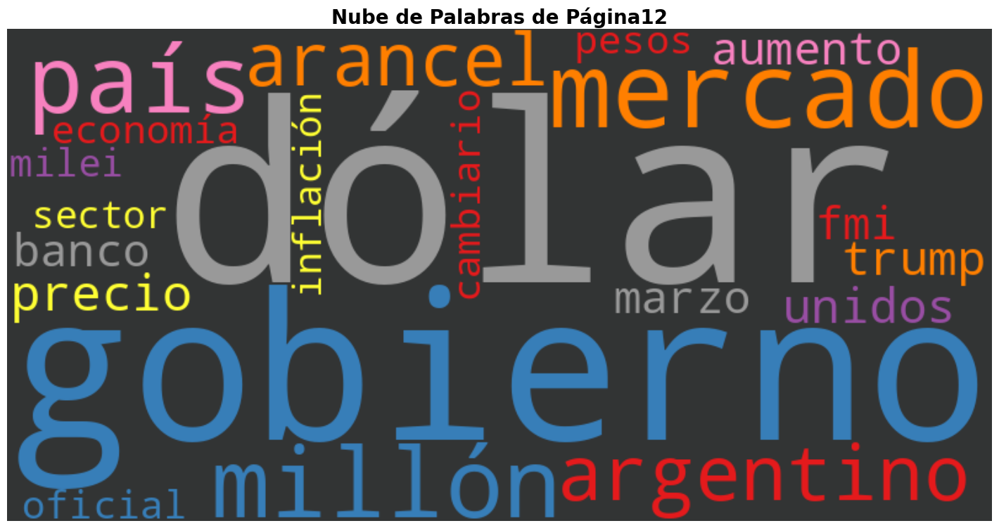

In [ ]:
plt.figure(figsize=(14, 8))
plt.title("Nube de Palabras de Página12", fontdict={'fontsize': 20, 'fontweight': 'bold'})
plt.imshow(wordcloud_generator, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
wordcloud_generator = WordCloud(
    width=800,
    height=400,
    background_color='#323434',
    colormap='Set2',
    stopwords=None,
    collocations=False

).generate_from_frequencies(frecuencias_dict_cl)

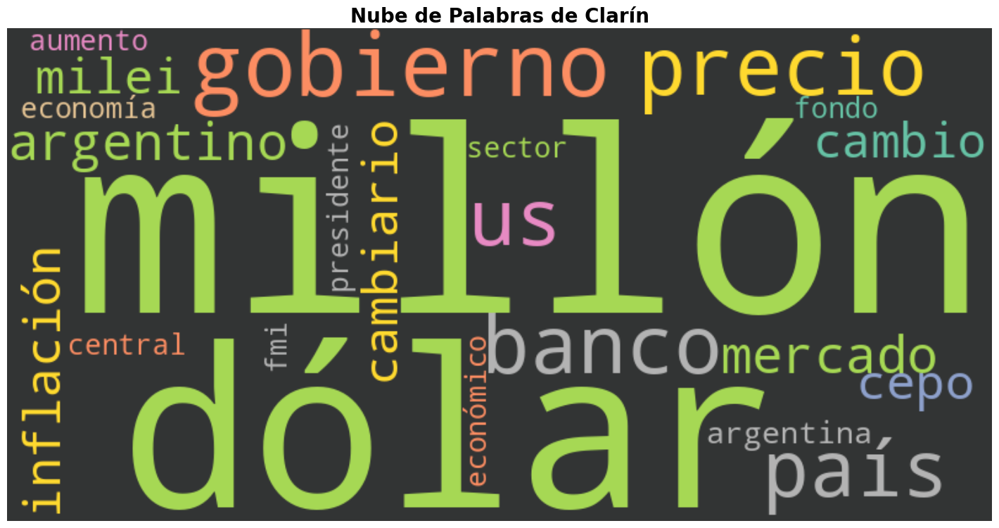

In [ ]:
plt.figure(figsize=(14, 8))
plt.title("Nube de Palabras de Clarín", fontdict={'fontsize': 20, 'fontweight': 'bold'})
plt.imshow(wordcloud_generator, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

text mining

In [24]:
import pandas as pd

In [13]:
data_pagina_lista = list(data_pagina.split('\n'))

# 🛍️Bolsa de Palabras

In [28]:
len(data_pagina_lista)

94

In [27]:
data_pagina_lista[1]

"['Otro de los sectores que reaccionó con alzas de precios a la devaluación fue el de la medicina prepaga. Totalmente fuera de rango, anunciaron subas de entre 4 y 5 por ciento para mayo, pero el Gobierno está intentando reducir el porcentaje para que se parezca algo más a la inflación. Lo concreto es que las empresas están viendo que el precio del dólar no es este y que a la larga habrá una corrección al alza, por eso remarcan.\\xa0', 'Luego de una reunión del Ministerio de Salud con el sector, les reclamaron que pongan los abonos con aumentos no mayores a los 3 puntos, que igual dejan al rubro acumulando incrementos muy por encima de la inflación general. Empezarían el lunes, algunas firmas, a corregir por pedido oficial.\\xa0', 'Desde comienzos de año, las firmas del sector subieron los abonos con el siguiente esquema: hasta 3,7 por ciento en febrero, 2,1 en marzo, 2,9 en abril y hasta 5 en mayo.\\xa0']"

In [63]:
data_dict = {}
for i, text in enumerate(data_pagina_lista):
    key = f"doc{i + 1}"
    data_dict[key] = text

print(data_dict)

{'doc1': "['Las cuentas públicas de las provincias cerraron 2024 con un superávit financiero del 0,1 por ciento del PIB, revirtiendo el resultado negativo de 2023, que fue de -0,3 por ciento del PIB.\\xa0Este superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos.', 'Según un informe de la consultora Politikon Chaco, el consolidado de provincias y Ciudad de Buenos Aires experimentó una contracción de los ingresos del -12,7 por ciento real interanual y del gasto del -15,1 real interanual.', 'Si bien los ingresos sufrieron una merma global de 12,7 billones depesos a precios de 2024, el recorte global de las erogaciones fue aún mayor, alcanzando los 15,4 billones a precios del mismo año.\\xa0', 'En tanto, los Ingresos Corrientes, que representan la mayor parte (99,4 por ciento), sufrieron una baja del 11,3 por ciento anual real.\\xa0Dentro de estos, la mayor caída se observó en las Transferencias Corrientes (-65,7), m

In [64]:
data_dict['doc2']

"['Otro de los sectores que reaccionó con alzas de precios a la devaluación fue el de la medicina prepaga. Totalmente fuera de rango, anunciaron subas de entre 4 y 5 por ciento para mayo, pero el Gobierno está intentando reducir el porcentaje para que se parezca algo más a la inflación. Lo concreto es que las empresas están viendo que el precio del dólar no es este y que a la larga habrá una corrección al alza, por eso remarcan.\\xa0', 'Luego de una reunión del Ministerio de Salud con el sector, les reclamaron que pongan los abonos con aumentos no mayores a los 3 puntos, que igual dejan al rubro acumulando incrementos muy por encima de la inflación general. Empezarían el lunes, algunas firmas, a corregir por pedido oficial.\\xa0', 'Desde comienzos de año, las firmas del sector subieron los abonos con el siguiente esquema: hasta 3,7 por ciento en febrero, 2,1 en marzo, 2,9 en abril y hasta 5 en mayo.\\xa0']"

In [65]:
len(data_dict)

94

In [16]:
# comprobamos llaves del diccionario
data_dict.keys()

dict_keys(['doc1', 'doc2', 'doc3', 'doc4', 'doc5', 'doc6', 'doc7', 'doc8', 'doc9', 'doc10', 'doc11', 'doc12', 'doc13', 'doc14', 'doc15', 'doc16', 'doc17', 'doc18', 'doc19', 'doc20', 'doc21', 'doc22', 'doc23', 'doc24', 'doc25', 'doc26', 'doc27', 'doc28', 'doc29', 'doc30', 'doc31', 'doc32', 'doc33', 'doc34', 'doc35', 'doc36', 'doc37', 'doc38', 'doc39', 'doc40', 'doc41', 'doc42', 'doc43', 'doc44', 'doc45', 'doc46', 'doc47', 'doc48', 'doc49', 'doc50', 'doc51', 'doc52', 'doc53', 'doc54', 'doc55', 'doc56', 'doc57', 'doc58', 'doc59', 'doc60', 'doc61', 'doc62', 'doc63', 'doc64', 'doc65', 'doc66', 'doc67', 'doc68', 'doc69', 'doc70', 'doc71', 'doc72', 'doc73', 'doc74', 'doc75', 'doc76', 'doc77', 'doc78', 'doc79', 'doc80', 'doc81', 'doc82', 'doc83', 'doc84', 'doc85', 'doc86', 'doc87', 'doc88', 'doc89', 'doc90', 'doc91', 'doc92', 'doc93', 'doc94'])

Clarin

In [75]:
data_clarin_lista = list(data_clarin.split('\n'))

In [76]:
datac_dict = {}
for i, text in enumerate(data_clarin_lista):
    key = f"doc{i + 1}"
    datac_dict[key] = text

print(datac_dict)

{'doc1': '[\'El ministro de Economía, Luis Caputo, y su equipo viajarán este martes a las reuniones de primavera del Fondo Monetario y el Banco Mundial en Washington. Será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas, acordados con el organismo a cambio de un préstamo de US$ 20.000 millones a la Argentina.\', \'Si bien la agenda aún no fue confirmada, se espera que los funcionarios participen de las reuniones de ministros de Finanzas y banqueros centrales, las comisiones del G20 y charlas con bancos de inversión. Según fuentes oficiales, Caputo irá acompañado del viceministro de Economía, José Luis Daza, el secretario de Finanzas, Pablo Quirno, el titular del Banco Central, Santiago Bausili, y su vicepresidente, Vladimir Werning. \', \'El titular de Economía y Daza comandaron las negociaciones para salir del cepo con el director del departamento para la re

In [77]:
len(data_clarin_lista)

99

In [ ]:
# comprobamos llaves del diccionario
datac_dict.keys()

dict_keys(['doc1', 'doc2', 'doc3', 'doc4', 'doc5', 'doc6', 'doc7', 'doc8', 'doc9', 'doc10', 'doc11', 'doc12', 'doc13', 'doc14', 'doc15', 'doc16', 'doc17', 'doc18', 'doc19', 'doc20', 'doc21', 'doc22', 'doc23', 'doc24', 'doc25', 'doc26', 'doc27', 'doc28', 'doc29', 'doc30', 'doc31', 'doc32', 'doc33', 'doc34', 'doc35', 'doc36', 'doc37', 'doc38', 'doc39', 'doc40', 'doc41', 'doc42', 'doc43', 'doc44', 'doc45', 'doc46', 'doc47', 'doc48', 'doc49', 'doc50', 'doc51', 'doc52', 'doc53', 'doc54', 'doc55', 'doc56', 'doc57', 'doc58', 'doc59', 'doc60', 'doc61', 'doc62', 'doc63', 'doc64', 'doc65', 'doc66', 'doc67', 'doc68', 'doc69', 'doc70', 'doc71', 'doc72', 'doc73', 'doc74', 'doc75', 'doc76', 'doc77', 'doc78', 'doc79', 'doc80', 'doc81', 'doc82', 'doc83', 'doc84', 'doc85', 'doc86', 'doc87', 'doc88', 'doc89', 'doc90', 'doc91', 'doc92', 'doc93', 'doc94', 'doc95', 'doc96', 'doc97', 'doc98', 'doc99'])

In [ ]:
datac_dict['doc1']

'[\'El ministro de Economía, Luis Caputo, y su equipo viajarán este martes a las reuniones de primavera del Fondo Monetario y el Banco Mundial en Washington. Será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas, acordados con el organismo a cambio de un préstamo de US$ 20.000 millones a la Argentina.\', \'Si bien la agenda aún no fue confirmada, se espera que los funcionarios participen de las reuniones de ministros de Finanzas y banqueros centrales, las comisiones del G20 y charlas con bancos de inversión. Según fuentes oficiales, Caputo irá acompañado del viceministro de Economía, José Luis Daza, el secretario de Finanzas, Pablo Quirno, el titular del Banco Central, Santiago Bausili, y su vicepresidente, Vladimir Werning. \', \'El titular de Economía y Daza comandaron las negociaciones para salir del cepo con el director del departamento para la región, Rod

Limpieza de los diccionarios

In [66]:
#Pagina12
for key in data_dict:
       data_dict[key] = limpiar_texto(data_dict[key])
       data_dict[key] = limpiar_texto_dos(data_dict[key])

In [67]:
data_dict['doc1']

'  las cuentas públicas de las provincias cerraron  con un superávit financiero del   por ciento del pib  revirtiendo el resultado negativo de   que fue de    por ciento del pib   superávit financiero se explica principalmente por una mayor contracción del gasto en comparación con la caída de los ingresos     según un informe de la consultora politikon chaco  el consolidado de provincias y ciudad de buenos aires experimentó una contracción de los ingresos del    por ciento real interanual y del gasto del    real interanual     si bien los ingresos sufrieron una merma global de   billones depesos a precios de   el recorte global de las erogaciones fue aún mayor  alcanzando los   billones a precios del mismo año      en tanto  los ingresos corrientes  que representan la mayor parte    por ciento   sufrieron una baja del   por ciento anual real   de estos  la mayor caída se observó en las transferencias corrientes       mientras que los ingresos tributarios disminuyeron en un    por cient

In [78]:
#Clarin
for key in datac_dict:
       datac_dict[key] = limpiar_texto(datac_dict[key])
       datac_dict[key] = limpiar_texto_dos(datac_dict[key])

In [79]:
datac_dict['doc1']

'  el ministro de economía  luis caputo  y su equipo viajarán este martes a las reuniones de primavera del fondo monetario y el banco mundial en washington  será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas  acordados con el organismo a cambio de un préstamo de us    millones a la argentina     si bien la agenda aún no fue confirmada  se espera que los funcionarios participen de las reuniones de ministros de finanzas y banqueros centrales  las comisiones del  y charlas con bancos de inversión  según fuentes oficiales  caputo irá acompañado del viceministro de economía  josé luis daza  el secretario de finanzas  pablo quirno  el titular del banco central  santiago bausili  y su vicepresidente  vladimir werning      el titular de economía y daza comandaron las negociaciones para salir del cepo con el director del departamento para la región  rodrigo valdés  

In [80]:
for key in datac_dict:
       datac_dict[key] = (datac_dict[key]).strip()

In [83]:
datac_dict['doc1']

'el ministro de economía  luis caputo  y su equipo viajarán este martes a las reuniones de primavera del fondo monetario y el banco mundial en washington  será el primer encuentro cara a cara con las autoridades de los organismos después de la salida parcial del cepo y la puesta en marcha el lunes de un esquema de flotación con bandas  acordados con el organismo a cambio de un préstamo de us    millones a la argentina     si bien la agenda aún no fue confirmada  se espera que los funcionarios participen de las reuniones de ministros de finanzas y banqueros centrales  las comisiones del  y charlas con bancos de inversión  según fuentes oficiales  caputo irá acompañado del viceministro de economía  josé luis daza  el secretario de finanzas  pablo quirno  el titular del banco central  santiago bausili  y su vicepresidente  vladimir werning      el titular de economía y daza comandaron las negociaciones para salir del cepo con el director del departamento para la región  rodrigo valdés  y 

In [106]:
indicep = list(data_dict.keys())

In [113]:
datapagina= pd.DataFrame.from_dict(data_dict, orient='index',columns=['texto'])

In [114]:
print(datapagina)

                                                   texto
doc1     las cuentas públicas de las provincias cerra...
doc2     otro de los sectores que reaccionó con alzas...
doc3     tras la devaluación del dólar oficial  el go...
doc4     durante el fin de semana largo por la celebr...
doc5     el mercado sigue a puro optimismo y algunas ...
...                                                  ...
doc90    el sector turístico busca repuntar algo de l...
doc91    la serie de medidas arancelarias anunciadas ...
doc92    en el marco del ajuste del estado que está h...
doc93                                                   
doc94                                                   

[94 rows x 1 columns]


In [116]:
# elimino las filas vacías
datapagina = datapagina[datapagina['texto'] != '']

In [117]:
print(datapagina)

                                                   texto
doc1     las cuentas públicas de las provincias cerra...
doc2     otro de los sectores que reaccionó con alzas...
doc3     tras la devaluación del dólar oficial  el go...
doc4     durante el fin de semana largo por la celebr...
doc5     el mercado sigue a puro optimismo y algunas ...
...                                                  ...
doc88    la dotación de personal de la administración...
doc89    las bolsas de wall street registraron en el ...
doc90    el sector turístico busca repuntar algo de l...
doc91    la serie de medidas arancelarias anunciadas ...
doc92    en el marco del ajuste del estado que está h...

[86 rows x 1 columns]


In [89]:
indice = list(datac_dict.keys())

In [118]:
dataclarin = pd.DataFrame.from_dict(datac_dict, orient='index',columns=['texto'])

In [119]:
print(dataclarin)

                                                   texto
doc1   el ministro de economía  luis caputo  y su equ...
doc2   la vertiginosa mutación que está teniendo el m...
doc3                                                    
doc4   en el último día del fin de semana largo  la c...
doc5   después de haber sostenido las tensiones cambi...
...                                                  ...
doc95  el indec dará a conocer el dato de inflación d...
doc96  brooke rollins  secretaria de agricultura de e...
doc97  el paro de la cgt se desarrolló en este contex...
doc98                                                   
doc99                                                   

[99 rows x 1 columns]


In [120]:
# elimino las filas vacías
dataclarin = dataclarin[dataclarin['texto'] != '']

In [121]:
print(dataclarin)

                                                   texto
doc1   el ministro de economía  luis caputo  y su equ...
doc2   la vertiginosa mutación que está teniendo el m...
doc4   en el último día del fin de semana largo  la c...
doc5   después de haber sostenido las tensiones cambi...
doc6   las últimas medidas del gobierno de javier mil...
...                                                  ...
doc93  en la última jornada de la semana  los mercado...
doc94  este viernes por la tarde  el directorio del f...
doc95  el indec dará a conocer el dato de inflación d...
doc96  brooke rollins  secretaria de agricultura de e...
doc97  el paro de la cgt se desarrolló en este contex...

[92 rows x 1 columns]


In [111]:
# Creamos la matriz de documentos-terminos usando CountVectorizer y excluimos las stop words del espaniol
from sklearn.feature_extraction.text import CountVectorizer

# Cargamos del paquete nltk las stopwords del espaniol a la lista "lines"
import nltk
nltk.download('stopwords')

lines = nltk.corpus.stopwords.words('spanish')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [122]:
# Inicializo el modelo excluyendo stopwords
cv = CountVectorizer(stop_words=lines)
# Ajustamos el modelo y lo aplicamos al texto de nuestro dataframe generando una matriz esparsa o matriz dispersa
data_cv = cv.fit_transform(datapagina.texto)
# Creamos un dataframe transformando a densa la matriz generada recien que tiene como columnas las palabras (terminos) y como filas los documentos
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
# Le asignamos los indices del dataframe anterior
data_dtm.index = datapagina.index

In [123]:
data_cv

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 17425 stored elements and shape (86, 6031)>

In [131]:
datapagina_dtm= data_dtm.transpose()
datapagina_dtm

,doc1,doc2,doc3,doc4,doc5,doc6,doc7,doc8,doc10,doc11,...,doc83,doc84,doc85,doc86,doc87,doc88,doc89,doc90,doc91,doc92
aba,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abajo,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
abandonó,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abarató,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abarca,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
último,0,0,0,1,0,0,0,0,1,0,...,1,0,0,0,0,1,0,0,0,0
últimos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
única,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
únicas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [132]:
top_dict = {}

# Por cada año
for c in datapagina_dtm.columns:
    top = datapagina_dtm[c].sort_values(ascending=False).head(30) # Ordeno las filas en forma decreciente y me quedo con las 30 palabras mas usadas
    top_dict[c]= list(zip(top.index, top.values))       # le asigno el año a la key del diccionario y como valor una tupla con la palabra y su frecuencia

print(top_dict)
print("\n")

# Imprimo las 15 palabras mas frecuentes por año
for anio, top_words in top_dict.items():
    print(anio) # imprimo la key
    print(', '.join([word for word, count in top_words[0:14]])) # imprimo las palabras en orden decreciente segun frecuencia y separadas con espacio y coma

{'doc1': [('ciento', np.int64(12)), ('ingresos', np.int64(9)), ('real', np.int64(6)), ('capital', np.int64(4)), ('corrientes', np.int64(4)), ('transferencias', np.int64(4)), ('gasto', np.int64(4)), ('mayor', np.int64(4)), ('interanual', np.int64(3)), ('baja', np.int64(3)), ('superávit', np.int64(3)), ('pib', np.int64(2)), ('recorte', np.int64(2)), ('caída', np.int64(2)), ('financiero', np.int64(2)), ('precios', np.int64(2)), ('año', np.int64(2)), ('global', np.int64(2)), ('tributarios', np.int64(2)), ('provincias', np.int64(2)), ('sufrieron', np.int64(2)), ('billones', np.int64(2)), ('contracción', np.int64(2)), ('merma', np.int64(2)), ('anual', np.int64(2)), ('gastos', np.int64(2)), ('personal', np.int64(1)), ('además', np.int64(1)), ('inversión', np.int64(1)), ('depesos', np.int64(1))], 'doc2': [('firmas', np.int64(2)), ('abonos', np.int64(2)), ('inflación', np.int64(2)), ('sector', np.int64(2)), ('ciento', np.int64(2)), ('mayo', np.int64(2)), ('puntos', np.int64(1)), ('rubro', np.in

In [134]:
# Inicializo el modelo para los articulos Clarin excluyendo stopwords
cv = CountVectorizer(stop_words=lines)
# Ajustamos el modelo y lo aplicamos al texto de nuestro dataframe generando una matriz esparsa o matriz dispersa
data_c_cv = cv.fit_transform(dataclarin.texto)
# Creamos un dataframe transformando a densa la matriz generada recien que tiene como columnas las palabras (terminos) y como filas los documentos
data_c_dtm = pd.DataFrame(data_c_cv.toarray(), columns=cv.get_feature_names_out())
# Le asignamos los indices del dataframe anterior
data_c_dtm.index = dataclarin.index

In [135]:
data_c_cv

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 21446 stored elements and shape (92, 7423)>

In [137]:
dataclarin_dtm = data_c_dtm.transpose()
dataclarin_dtm

,doc1,doc2,doc4,doc5,doc6,doc7,doc8,doc9,doc10,doc11,...,doc88,doc89,doc90,doc91,doc92,doc93,doc94,doc95,doc96,doc97
aba,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abajo,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abandonamos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abandonar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
abandonará,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
últimos,0,0,1,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
única,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
únicamente,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
único,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [138]:
top_dict = {}

# Por cada año
for c in dataclarin_dtm.columns:
    top = dataclarin_dtm[c].sort_values(ascending=False).head(30) # Ordeno las filas en forma decreciente y me quedo con las 30 palabras mas usadas
    top_dict[c]= list(zip(top.index, top.values))       # le asigno el año a la key del diccionario y como valor una tupla con la palabra y su frecuencia

print(top_dict)
print("\n")

# Imprimo las 15 palabras mas frecuentes por año
for anio, top_words in top_dict.items():
    print(anio) # imprimo la key
    print(', '.join([word for word, count in top_words[0:14]])) # imprimo las palabras en orden decreciente segun frecuencia y separadas con espacio y coma

{'doc1': [('banco', np.int64(4)), ('dijo', np.int64(4)), ('us', np.int64(4)), ('economía', np.int64(4)), ('millones', np.int64(4)), ('aún', np.int64(3)), ('gobierno', np.int64(3)), ('mientras', np.int64(3)), ('reservas', np.int64(3)), ('si', np.int64(3)), ('ministro', np.int64(3)), ('argentina', np.int64(3)), ('caputo', np.int64(3)), ('swap', np.int64(3)), ('luis', np.int64(3)), ('fondo', np.int64(3)), ('central', np.int64(3)), ('cepo', np.int64(3)), ('lunes', np.int64(2)), ('cara', np.int64(2)), ('cumbre', np.int64(2)), ('director', np.int64(2)), ('georgieva', np.int64(2)), ('tras', np.int64(2)), ('comercial', np.int64(2)), ('país', np.int64(2)), ('organismo', np.int64(2)), ('oficial', np.int64(2)), ('nuevo', np.int64(2)), ('sigue', np.int64(2))], 'doc2': [('líder', np.int64(6)), ('liderazgo', np.int64(6)), ('mientras', np.int64(6)), ('relación', np.int64(5)), ('trabajo', np.int64(5)), ('chile', np.int64(4)), ('estudio', np.int64(4)), ('ecuador', np.int64(4)), ('tendencia', np.int64(4